In [27]:
import pandas as pd

data = pd.read_csv('songs_normalize.csv')
data.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066,False,1999,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546,False,1999,66,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop


In [28]:
for col in data:
    print(col, end="; ")

data.describe()

artist; song; duration_ms; explicit; year; popularity; danceability; energy; key; loudness; mode; speechiness; acousticness; instrumentalness; liveness; valence; tempo; genre; 

,duration_ms,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,228748.124500,2009.49400,59.872500,0.667438,0.720366,5.378000,-5.512434,0.553500,0.103568,0.128955,0.015226,0.181216,0.551690,120.122558
std,39136.569008,5.85996,21.335577,0.140416,0.152745,3.615059,1.933482,0.497254,0.096159,0.173346,0.087771,0.140669,0.220864,26.967112
min,113000.000000,1998.00000,0.000000,0.129000,0.054900,0.000000,-20.514000,0.000000,0.023200,0.000019,0.000000,0.021500,0.038100,60.019000
25%,203580.000000,2004.00000,56.000000,0.581000,0.622000,2.000000,-6.490250,0.000000,0.039600,0.014000,0.000000,0.088100,0.386750,98.985750
50%,223279.500000,2010.00000,65.500000,0.676000,0.736000,6.000000,-5.285000,1.000000,0.059850,0.055700,0.000000,0.124000,0.557500,120.021500
75%,248133.000000,2015.00000,73.000000,0.764000,0.839000,8.000000,-4.167750,1.000000,0.129000,0.176250,0.000068,0.241000,0.730000,134.265500
max,484146.000000,2020.00000,89.000000,0.975000,0.999000,11.000000,-0.276000,1.000000,0.576000,0.976000,0.985000,0.853000,0.973000,210.851000


- **artist**: Name of the Artist.
- **song**: Name of the Track.
- **duration_ms**: Duration of the track in milliseconds.
- **explicit**: The lyrics or content of a song or a music video contain one or more of the criteria which could be considered offensive or unsuitable for children.
- **year**: Release Year of the track.
- **popularity**: The higher the value the more popular the song is.
- **danceability**: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.
- **energy**: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
- **key**: The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.
- **loudness**: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typically range between -60 and 0 db.
- **mode**: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.
- **speechiness**: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.
- **acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.
- **instrumentalness**: Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.
- **liveness**: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.
- **valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
- **tempo**: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
- **genre**: Genre of the track.


In [29]:
data = data.drop_duplicates(data.columns)
print("After dropping duplicates (where all columns have the same data)...")

def find_duplicates(list):
    from collections import Counter
    counts = Counter(list)
    return [value for value in list if counts[value] > 1]

data.dropna(inplace=True)
        
if sorted(list(set(data["song"].tolist()))) != sorted(data["song"].tolist()):
    print("There are different songs with the same name in the data!\n")

dupsongs = find_duplicates(data["song"].tolist())
print("The names of the songs that appear in at least two songs in the data are:", set(dupsongs))
print("\nThey might be different songs with the same name but different artists...")
truedupsongs = set()
for song in set(dupsongs):
    dupartists = find_duplicates(data[data["song"] == song]["artist"])
    for artist in set(dupartists):
        dupsongs = data[(data["song"] == song) & (data["artist"] == artist)]
        for index, row in dupsongs.iterrows():
            truedupsongs.add(f"{row['artist']}, {row['song']}")

print("The names of the songs that appear in at least two songs in the data with the same artist are:", truedupsongs)
print("\nThese songs have a duplicate with the same name and artist. Sometimes the values in the other columns for their rows equal, others they are slightly different.")
print("We concluded that they could be different versions of the same song, and as such we opted not to delete them.\n")

# Write duplicates that are not 100% equal to a file
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    dups = data.copy()
    dups['artist_song'] = dups['artist'] + ', ' + dups['song']
    dups[dups["artist_song"].isin(truedupsongs)].sort_values(by=['song', 'artist']).to_csv('same_song_twice.csv', index=False)

print("The entries with the same name and artist that differ in some of the other columns have been written to `same_song_twice.csv`.")

After dropping duplicates (where all columns have the same data)...
There are different songs with the same name in the data!

The names of the songs that appear in at least two songs in the data are: {"It's My Life", "Don't Tell Me", 'No Hands (feat. Roscoe Dash & Wale)', 'Closer', 'Sing', 'Let Me Love You', 'Impossible', 'Rise', 'Like Toy Soldiers', 'Baby', 'I Knew You Were Trouble.', 'Incomplete', 'I Like It', 'Wings', 'The Heart Wants What It Wants', 'Beautiful', 'Crazy', 'Faded', 'Stole the Show', 'Sorry', 'Wherever You Will Go', 'Mercy', 'Jumpman', "When I'm Gone", 'Never Forget You', 'Miss Independent', 'Love', "Gotta Get Thru This - D'N'D Radio Edit", 'Higher', 'Breathe', 'Forever', 'Hotline Bling', "You Don't Own Me (feat. G-Eazy)", "Don't", 'All Time Low', 'Say It', 'Bodak Yellow', 'Play', 'Without Me', 'Bad Blood', 'Here', 'With You', 'Perfect', 'Fast Car', 'Spotlight', 'Ride', 'Team', 'Promise', 'Girlfriend', 'Work', 'Good Life', 'Style', 'Motivation', 'What You Know', 'The

In [30]:
data['explicit'] = data['explicit'].astype(int)

def parse_genre_string(genre_string):
    if genre_string == "set()":
        return genre_string
    return set(genre_string.split(", "))

for col in ["year", "explicit", "key", "mode"]:
    print(f"possible values for {col}:", set(data[col].tolist()))

possible_genres = set()
for val in data["genre"]:
    for genre in val.split(","):
        possible_genres.add(genre.strip())

print(f"possible values for genre:", possible_genres)
print(f"possible values for artist:", set(data["artist"].tolist()))



possible values for year: {1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020}
possible values for explicit: {0, 1}
possible values for key: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}
possible values for mode: {0, 1}
possible values for genre: {'hip hop', 'country', 'R&B', 'latin', 'metal', 'World/Traditional', 'rock', 'jazz', 'classical', 'Dance/Electronic', 'blues', 'easy listening', 'pop', 'set()', 'Folk/Acoustic'}
possible values for artist: {'Anastacia', 'Akon', 'Saweetie', 'Fergie', 'The Fray', 'Jeremih', 'Sophie Ellis-Bextor', 'Rizzle Kicks', 'Logic', 'Tom Odell', 'Example', 'Rixton', 'Kardinal Offishall', 'Elvis Presley', 'DJ Khaled', 'Cali Swag District', 'Sunshine Anderson', 'Robin Thicke', 'Eamon', 'Ne-Yo', 'Lil Peep', 'S Club 7', 'Kodak Black', 'Nelly Furtado', 'Chamillionaire', 'Lil Tecca', 'Westlife', 'Big Sean', 'Miley Cyrus', 'Chicane', 'Black Eyed Peas', 'Migos', 'Kelly Clarkson', 'Joel C

In [31]:
# binary possible genres
possible_genres.discard("set()")
binary_columns = [[int(genre in parse_genre_string(row)) for genre in possible_genres] for row in data.genre.to_list()]
data[list(possible_genres)] = pd.DataFrame(binary_columns, index=data.index)
data.drop(columns="genre", inplace=True)
data[list(possible_genres)]

,hip hop,country,R&B,latin,metal,World/Traditional,rock,jazz,classical,Dance/Electronic,blues,easy listening,pop,Folk/Acoustic
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
2,0,1,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1996,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1997,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1998,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [32]:
# Popularity has values between 0 and 100
# Normalize it like other columns so the scale becomes between 0 and 1
data["popularity"] = data["popularity"] / 100

# Also normalize loudness
data['loudness'] = 10**(data['loudness']/10)


In [33]:
# Too many values with popularity 0
# TODO fetch them from spotify API?
data[data["popularity"] == 0]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,...,metal,World/Traditional,rock,jazz,classical,Dance/Electronic,blues,easy listening,pop,Folk/Acoustic
59,Oasis,Go Let It Out,278666,0,2000,0.0,0.408,0.849,2,0.273464,...,0,0,1,0,0,0,0,0,0,1
62,Mariah Carey,Against All Odds (Take A Look at Me Now) (feat...,199480,0,2011,0.0,0.471,0.514,1,0.275486,...,0,0,0,0,0,0,0,0,1,0
126,Jennifer Lopez,Ain't It Funny,246160,0,2001,0.0,0.707,0.869,5,0.352777,...,0,0,0,0,0,0,0,0,1,0
175,DB Boulevard,Point Of View - Radio Edit,231166,0,2018,0.0,0.676,0.715,6,0.206348,...,0,0,0,0,0,1,0,0,0,0
182,Musiq Soulchild,Love,304666,0,2000,0.0,0.569,0.385,1,0.101883,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1789,CNCO,Reggaetón Lento (Remix),188786,0,2017,0.0,0.623,0.909,4,0.492153,...,0,0,0,0,0,0,0,0,1,0
1794,Shawn Mendes,Mercy,208733,0,2017,0.0,0.561,0.674,4,0.324938,...,0,0,0,0,0,0,0,0,1,0
1850,Loud Luxury,Body (feat. brando),163216,0,2017,0.0,0.752,0.764,1,0.363162,...,0,0,0,0,0,1,0,0,1,0
1913,NLE Choppa,Shotta Flow (feat. Blueface) [Remix],176631,1,2019,0.0,0.894,0.511,2,0.333580,...,0,0,0,0,0,0,0,0,0,0


In [34]:
# for now we're deleting them
data = data[data["popularity"] != 0]

In [35]:
data.describe()

,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,...,metal,World/Traditional,rock,jazz,classical,Dance/Electronic,blues,easy listening,pop,Folk/Acoustic
count,1815.000000,1815.000000,1815.000000,1815.00000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,...,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000
mean,229362.042424,0.277686,2009.293113,0.63773,0.667720,0.720763,5.394490,0.306668,0.550964,0.104467,...,0.035262,0.004959,0.119008,0.001102,0.000551,0.184573,0.002204,0.003857,0.812121,0.009917
std,39635.148615,0.447981,5.903957,0.15174,0.142174,0.153098,3.598936,0.119510,0.497533,0.096967,...,0.184491,0.070262,0.323887,0.033186,0.023473,0.388058,0.046906,0.062000,0.390723,0.099118
min,113000.000000,0.000000,1998.000000,0.01000,0.129000,0.054900,0.000000,0.008884,0.000000,0.023200,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,204282.500000,0.000000,2004.000000,0.58000,0.580500,0.622500,2.000000,0.224440,0.000000,0.039700,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,223853.000000,0.000000,2009.000000,0.67000,0.676000,0.736000,6.000000,0.296142,1.000000,0.061200,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,249219.500000,1.000000,2014.000000,0.74000,0.767000,0.840000,8.000000,0.383442,1.000000,0.130000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,484146.000000,1.000000,2020.000000,0.89000,0.975000,0.999000,11.000000,0.938426,1.000000,0.576000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [38]:
# Number of songs per artist
print(data["artist"].value_counts().to_string())


Rihanna                                      23
Eminem                                       21
Drake                                        20
Calvin Harris                                20
David Guetta                                 18
Britney Spears                               18
Beyoncé                                      16
Taylor Swift                                 16
Chris Brown                                  15
Kanye West                                   15
Katy Perry                                   15
Black Eyed Peas                              14
JAY-Z                                        12
Jason Derulo                                 11
P!nk                                         11
Nelly                                        11
Bruno Mars                                   11
Justin Timberlake                            11
Usher                                        11
Coldplay                                     11
Flo Rida                                

In [7]:
data = data.drop(columns=['artist', 'song'])
data

,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,...,blues,metal,jazz,hip hop,classical,R&B,latin,World/Traditional,rock,country
0,211160,0,2000,0.77,0.751,0.834,1,0.285496,0,0.0437,...,0,0,0,0,0,0,0,0,0,0
1,167066,0,1999,0.79,0.434,0.897,0,0.322255,1,0.0488,...,0,0,0,0,0,0,0,0,1,0
2,250546,0,1999,0.66,0.529,0.496,7,0.125690,1,0.0290,...,0,0,0,0,0,0,0,0,0,1
3,224493,0,2000,0.78,0.551,0.913,0,0.392374,0,0.0466,...,0,1,0,0,0,0,0,0,1,0
4,200560,0,2000,0.65,0.614,0.928,8,0.330674,0,0.0516,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,181026,0,2019,0.79,0.842,0.734,1,0.311530,0,0.0588,...,0,0,0,0,0,0,0,0,0,0
1996,178426,0,2019,0.78,0.552,0.702,9,0.268720,1,0.1570,...,0,0,0,0,0,0,0,0,0,0
1997,200593,0,2019,0.69,0.847,0.678,9,0.136930,1,0.1090,...,0,0,0,1,0,0,0,0,0,1
1998,171029,0,2019,0.75,0.741,0.520,8,0.177296,1,0.0656,...,0,0,0,0,0,0,0,0,0,0


In [36]:
import seaborn as sns

<AxesSubplot:xlabel='explicit', ylabel='count'>

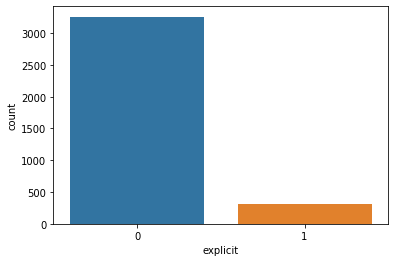

In [149]:
sns.countplot(data=data, x='explicit') 

<AxesSubplot:xlabel='year', ylabel='count'>

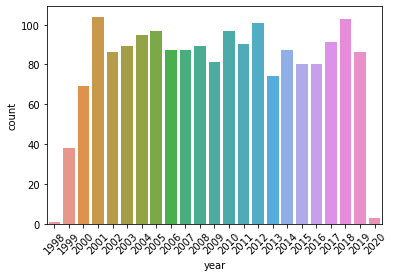

In [37]:
c = sns.countplot(data=data, x='year') 
c.set_xticklabels(c.get_xticklabels(), rotation=45)
c

<AxesSubplot:xlabel='key', ylabel='count'>

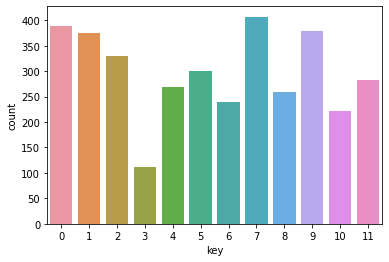

In [151]:
sns.countplot(data=data, x='key') 


<AxesSubplot:xlabel='mode', ylabel='count'>

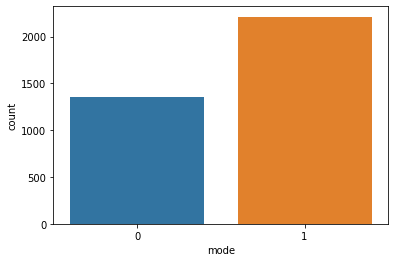

In [152]:
sns.countplot(data=data, x='mode') 

<AxesSubplot:xlabel='acousticness', ylabel='Count'>

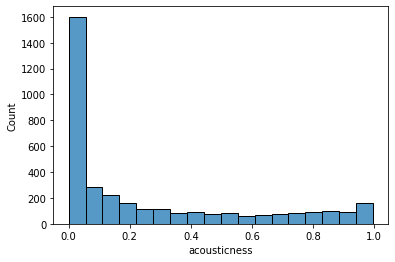

In [153]:
sns.histplot(data=data, x='acousticness')

<AxesSubplot:>

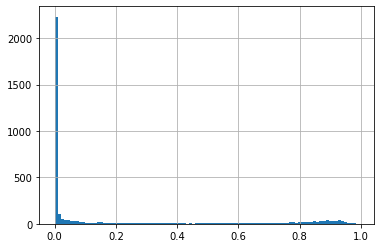

In [154]:
data['instrumentalness'].hist(bins=100)

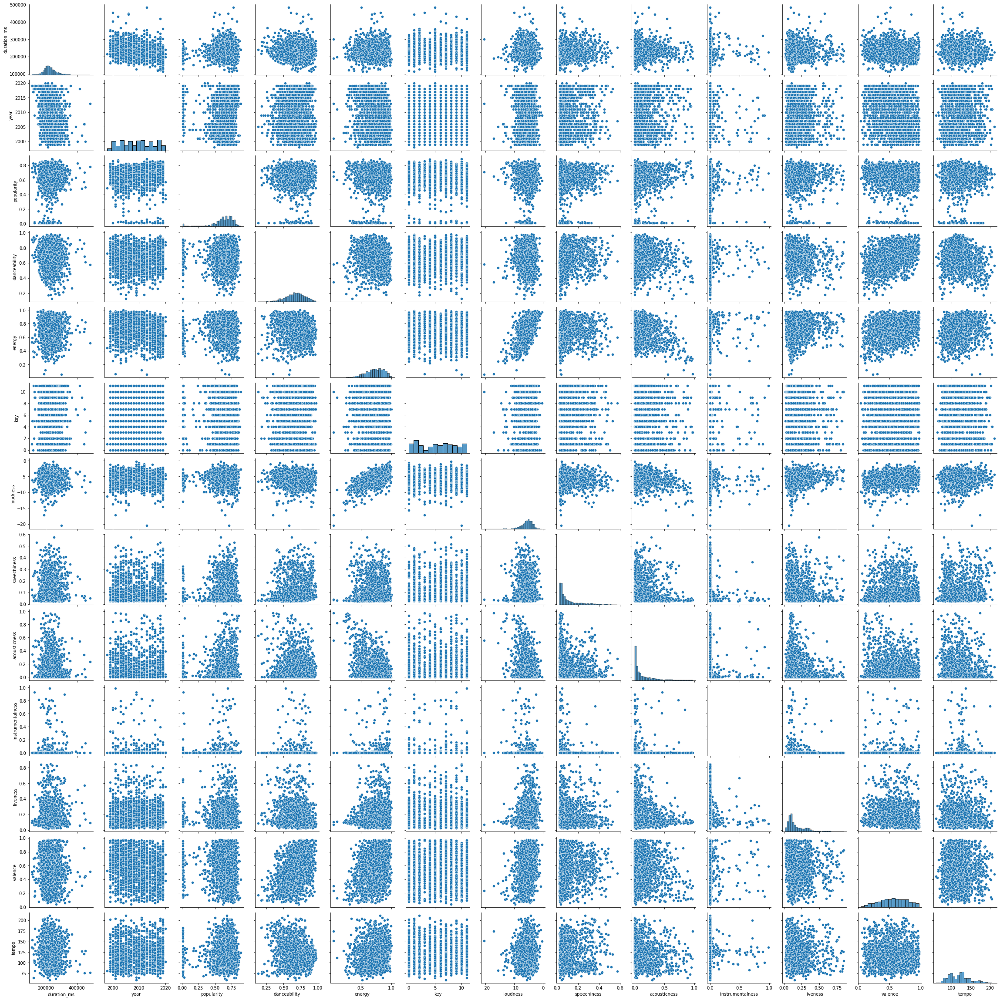

In [24]:
pair_plottable_data = data[['duration_ms', 'year', 'popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]
sns.pairplot(pair_plottable_data)

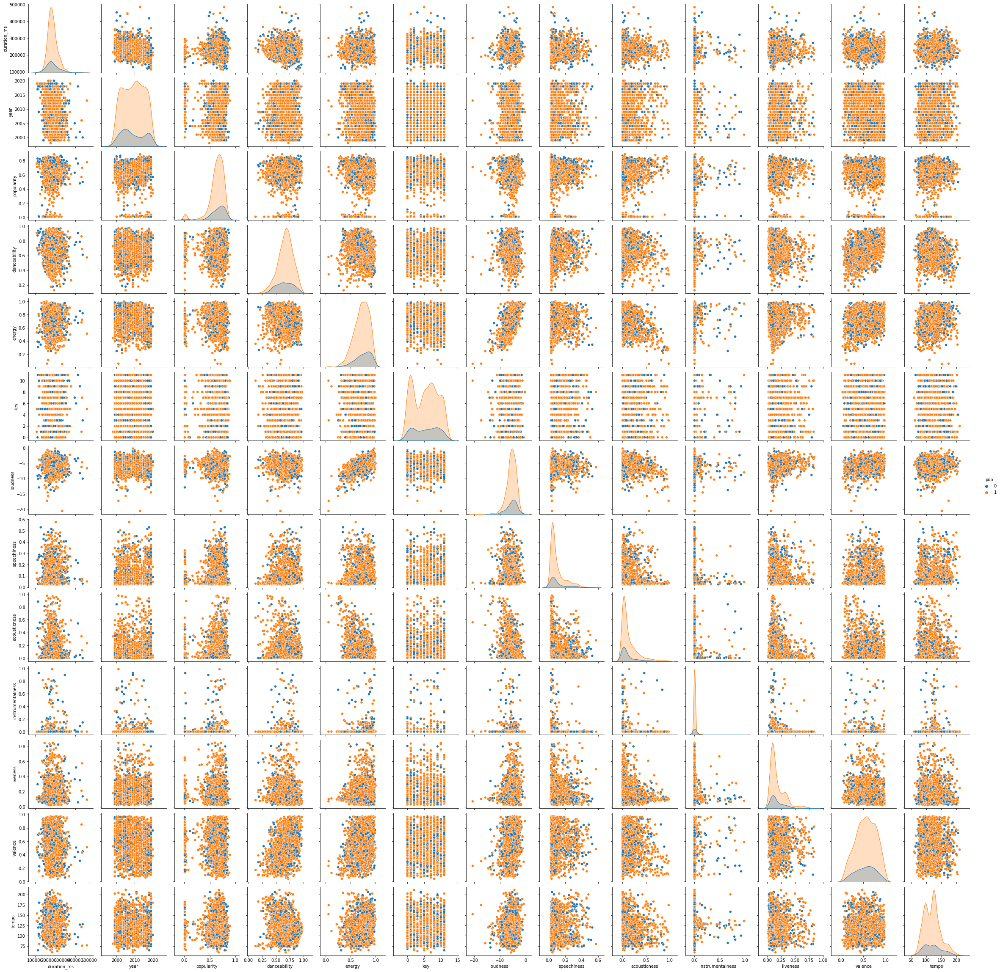

In [43]:
pair_plottable_data = data[['duration_ms', 'year', 'popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'pop']]
sns.pairplot(pair_plottable_data, hue="pop")

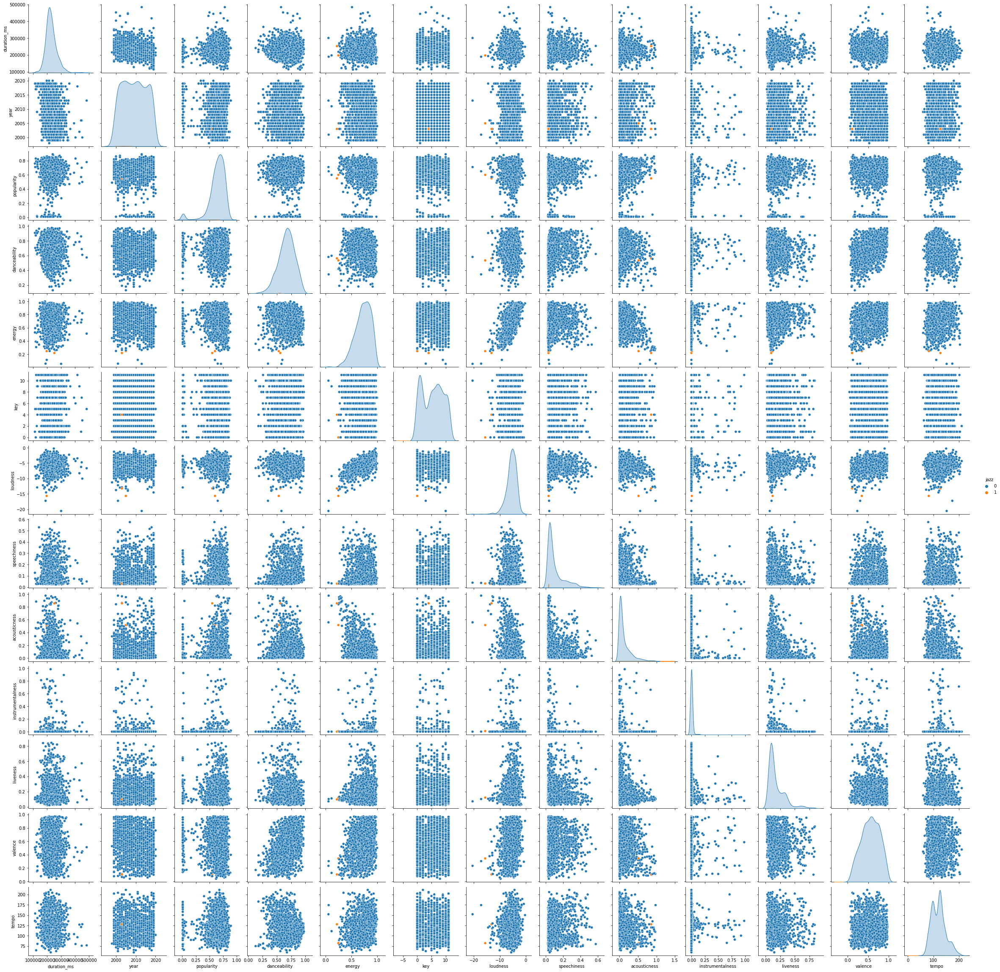

In [13]:
pair_plottable_data = data[['duration_ms', 'year', 'popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'jazz']]
sns.pairplot(pair_plottable_data, hue="jazz")

Total: 1815
pop                  1474
hip hop               717
R&B                   415
Dance/Electronic      335
rock                  216
metal                  64
latin                  59
Folk/Acoustic          18
country                18
World/Traditional       9
easy listening          7
blues                   4
jazz                    2
classical               1
Name: variable, dtype: int64


<AxesSubplot:xlabel='variable', ylabel='count'>

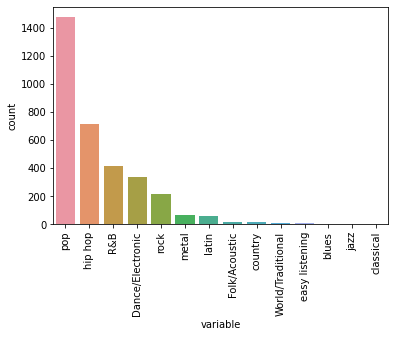

In [9]:
melted_data = pd.melt(data, value_vars=possible_genres)
melted_data = melted_data[melted_data['value'] == 1]
print(f"Total: {data.shape[0]}")
print(melted_data['variable'].value_counts())
c = sns.countplot(x="variable", data=melted_data, order=melted_data['variable'].value_counts().index)
c.set_xticklabels(c.get_xticklabels(), rotation=90)
c

In [9]:
melted_data = pd.melt(data, value_vars=possible_genres)
melted_data = melted_data[melted_data['value'] == 1]
genrecounts = melted_data['variable'].value_counts()
removed_genres = genrecounts[genrecounts < 50].index
data.drop(columns=removed_genres, inplace=True)
possible_genres = possible_genres.difference(removed_genres)
data.describe()


,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,...,liveness,valence,tempo,Dance/Electronic,pop,metal,hip hop,R&B,latin,rock
count,1815.000000,1815.000000,1815.000000,1815.00000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,...,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000,1815.000000
mean,229362.042424,0.277686,2009.293113,0.63773,0.667720,0.720763,5.394490,0.306668,0.550964,0.104467,...,0.182711,0.554949,120.096574,0.184573,0.812121,0.035262,0.395041,0.228650,0.032507,0.119008
std,39635.148615,0.447981,5.903957,0.15174,0.142174,0.153098,3.598936,0.119510,0.497533,0.096967,...,0.141490,0.220306,27.285496,0.388058,0.390723,0.184491,0.488994,0.420079,0.177391,0.323887
min,113000.000000,0.000000,1998.000000,0.01000,0.129000,0.054900,0.000000,0.008884,0.000000,0.023200,...,0.021500,0.040600,60.019000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,204282.500000,0.000000,2004.000000,0.58000,0.580500,0.622500,2.000000,0.224440,0.000000,0.039700,...,0.088850,0.395000,98.037000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,223853.000000,0.000000,2009.000000,0.67000,0.676000,0.736000,6.000000,0.296142,1.000000,0.061200,...,0.126000,0.564000,120.015000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,249219.500000,1.000000,2014.000000,0.74000,0.767000,0.840000,8.000000,0.383442,1.000000,0.130000,...,0.242500,0.733500,135.002000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,484146.000000,1.000000,2020.000000,0.89000,0.975000,0.999000,11.000000,0.938426,1.000000,0.576000,...,0.843000,0.973000,210.851000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [43]:
frames = []
for genre in possible_genres:
    genre_data = data[data[genre] == True].copy()
    genre_data['genre'] = genre
    frames.append(genre_data)
data_for_frames = pd.concat(frames)

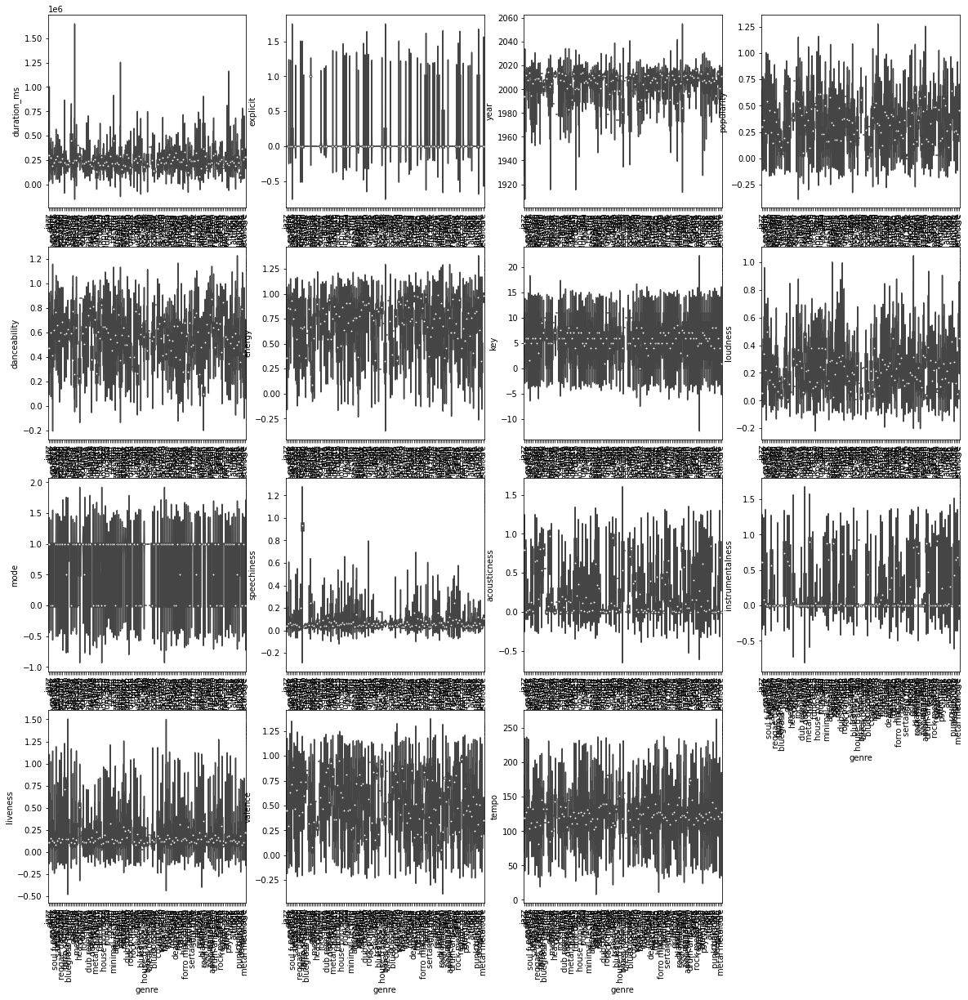

In [134]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 20))

cols = '''duration_ms
explicit
year
popularity
danceability
energy
key
loudness
mode
speechiness
acousticness
instrumentalness
liveness
valence
tempo'''.split()

for column_index, column in enumerate(cols):
    plt.subplot(4, 4, column_index + 1)
    c = sns.violinplot(x='genre', y=column, data=data_for_frames)
    c.set_xticklabels(c.get_xticklabels(), rotation=90)

<AxesSubplot:>

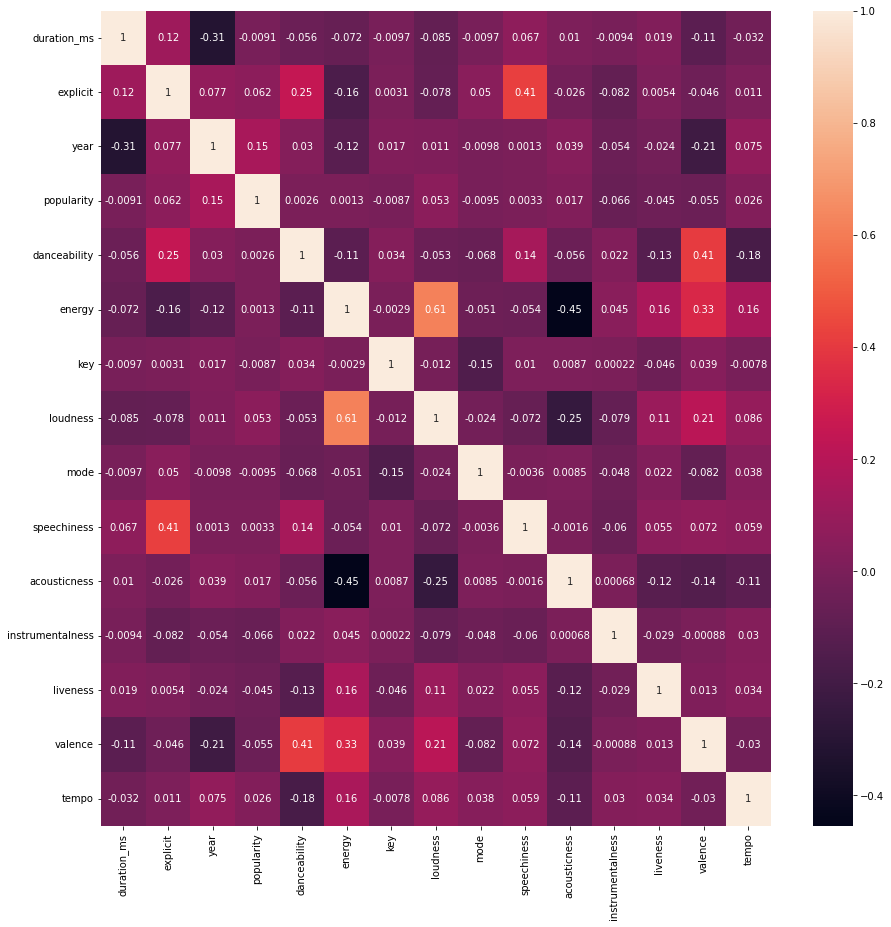

In [45]:
plt.figure(figsize=(15,15))
sns.heatmap(data.drop(columns=possible_genres).corr(), annot=True)

- [DecisionTreeClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
    - `class sklearn.tree.DecisionTreeClassifier(*, criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0)`
- [RandomForestClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)
    - `class sklearn.ensemble.RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)`
- [MLPClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html#sklearn.neural_network.MLPClassifier)
    - `class sklearn.neural_network.MLPClassifier(hidden_layer_sizes=(100,), activation='relu', *, solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)`
- [KNeighborsClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html)
    - `class sklearn.neighbors.KNeighborsClassifier(n_neighbors=5, *, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)`
- [SVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC)
    - `class sklearn.svm.SVC(*, C=1.0, kernel='rbf', degree=3, gamma='scale', coef0=0.0, shrinking=True, probability=False, tol=0.001, cache_size=200, class_weight=None, verbose=False, max_iter=- 1, decision_function_shape='ovr', break_ties=False, random_state=None)`
    - For kernel='linear', use [LinearSVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC)
    - Also [NuSVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.NuSVC.html#sklearn.svm.NuSVC)
- [LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)
    - `class sklearn.linear_model.LogisticRegression(penalty='l2', *, dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None)`
- [GaussianNB](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB)
    - `class sklearn.naive_bayes.GaussianNB(*, priors=None, var_smoothing=1e-09)`
    - Because many of the features are not discrete, MultinomialNB, ComplementNB, BernoulliNB and CategoricalNB are not adequate for this problem.

In [19]:
from math import ceil
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, multilabel_confusion_matrix
from scipy.stats import loguniform

input_cols = [
    'duration_ms', 'explicit', 'year', 'popularity', 'danceability', 'energy', 'key', 
    'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 
    'valence', 'tempo'
    ]

output_cols = list(possible_genres)

averages = [None, "macro", "weighted", "micro", "samples"]

In [ ]:
def show_confusion_matrix(cms, target_names, output_labels, title):
    ncols = 4
    nrows = int(ceil(len(cms) / ncols))
    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols,5*nrows))
    fig.suptitle(title, fontsize=32)
    fig.subplots_adjust(hspace=0.3, wspace=0.3)

    for ax in axs.reshape(-1)[len(cms):]:
        fig.delaxes(ax)

    for cm, ax, label in zip(cms, axs.reshape(-1), output_labels):
        gnames = ["True Negative", "False Positive", "False Negative", "True Positive"]
        gcounts = [f"{v:0.0f}" for v in cm.flatten()]
        gpercentages = [f"{v:.2%}" for v in cm.flatten()/np.sum(cm)]
        annot = np.asarray([f"{name}\n{count}\n{percentage}" for name, count, percentage in zip(gnames, gcounts, gpercentages)]).reshape(2, 2)

        sns.heatmap(cm, ax=ax, annot=annot, fmt="", cmap="Blues", xticklabels=target_names, yticklabels=target_names)
        ax.set_title(label)
        ax.set_ylabel('Actual')
        ax.set_xlabel('Predicted')
        ax.xaxis.tick_top()
        ax.xaxis.set_label_position('top')

def evaluate_model(model, testing_inputs, testing_classes, output_cols, sample_weight=None):
    predictions = model.predict(testing_inputs)

    print("="*70)
    print(f"Evaluation metrics for {model.__class__.__name__}")
    print("="*70)

    score = model.score(testing_inputs, testing_classes) 
    print(f"{model.__class__.__name__}'s default score metric: {score}")


    print("Classification report")
    print(
        classification_report(testing_classes, predictions, target_names=output_cols, sample_weight=sample_weight, digits=4, zero_division=1)
    )

    accuracy = accuracy_score(testing_classes, predictions, sample_weight=sample_weight)
    print(f"Accuracy: {accuracy:.4f}")

    for testing_class, pred, col in zip(np.transpose(testing_classes), np.transpose(predictions), output_cols):
        accuracy = accuracy_score(testing_class, pred, sample_weight=sample_weight)
        print(f"Accuracy (for {col}): {accuracy:.4f}")

    cms = multilabel_confusion_matrix(testing_classes, predictions, sample_weight=sample_weight, samplewise=False)
    show_confusion_matrix(cms, ['no', 'yes'], output_cols, f"Confusion matrices for {model.__class__.__name__}")

    print("="*70)

def train_and_evaluate(input_cols, output_cols, model, params, n_iter=None, sample_weight=None, random_state=42):
    inputs = data[input_cols].values
    classes = data[output_cols].values
    (training_inputs, testing_inputs, training_classes, testing_classes) = train_test_split(inputs, classes, test_size=0.2, random_state=random_state)

    clf = None
    if n_iter == None:
        clf = GridSearchCV(model, params, scoring=None, n_jobs=-1, cv=5)
    else:
        clf = RandomizedSearchCV(
            model, params, 
            n_iter=700, scoring=None, 
            n_jobs=-1, cv=5, random_state=random_state)
    
    clf.fit(training_inputs, training_classes)
    print(f"Best params for {model.__class__.__name__}: {clf.best_params_}")

    evaluate_model(clf.best_estimator_, testing_inputs, testing_classes, output_cols, sample_weight=sample_weight)


random_state = 42
n_iter=10

def use_model(model, params):
    train_and_evaluate(input_cols, output_cols, model, params, n_iter=n_iter, random_state=random_state)


In [ ]:
use_model(
    DecisionTreeClassifier(random_state=random_state), 
    {
        "criterion": ['gini', 'entropy'],
        'splitter': ['best', 'random'],
        "max_depth": range(1,15),
        'max_features': range(1, len(input_cols)),
        "min_samples_split": range(2,15),
        "min_samples_leaf": range(1,7)
    }
)

: 

: 

In [ ]:
use_model(
    RandomForestClassifier(n_jobs=-1, random_state=random_state), 
    { 
        'n_estimators': [200, 500],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth' : [4,5,6,7,8],
        'criterion' :['gini', 'entropy']
    }
)

In [ ]:
use_model(
    MLPClassifier(random_state=random_state), 
    {
        'hidden_layer_sizes': [(10,30,10),(20,)],
        'activation': ['tanh', 'relu'],
        'solver': ['sgd', 'adam'],
        'alpha': [0.0001, 0.05],
        'learning_rate': ['constant','adaptive'],
    }
)

In [ ]:
use_model(
    KNeighborsClassifier(n_jobs=-1), 
    {
        "n_neighbors": list(range(1,31)),
        "weights": ['uniform', 'distance'],
    }
)

In [ ]:
use_model(
    SVC(random_state=random_state), 
    {
        'C': [0.1, 1, 10, 100],
        'gamma': [1,0.1,0.01,0.001],
        'kernel': ['rbf', 'poly', 'sigmoid']
    }
)

In [ ]:
use_model(
    LinearSVC(random_state=random_state), 
    {
        'C': [0.1,1, 10, 100],
    }
)

In [ ]:
use_model(
    NuSVC(random_state=random_state), 
    {
        'nu': [0.1, 0.3, 0.5, 1.0],
        'gamma': [1,0.1,0.01,0.001],
        'kernel': ['rbf', 'poly', 'sigmoid']
    }
)

In [ ]:
use_model(
    LogisticRegression(random_state=random_state, n_jobs=-1), 
    {
        "solver": ['newton-cg', 'lbfgs', 'liblinear'],
        "penalty": ['none', 'l1', 'l2', 'elasticnet'],
        "C": loguniform(1e-5, 100)
    }
)

In [ ]:
use_model(
    GaussianNB(), 
    {
        'var_smoothing': np.logspace(0,-9, num=100)
    }
)